<a href="https://colab.research.google.com/github/ipgub/TIF456/blob/main/nb/2025_CV_W11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Morphological Image Processing

In [1]:
import cv2
from google.colab.patches import cv2_imshow
import math
import numpy as np
import sys
import matplotlib.pyplot as plt

# Additional library
import urllib.request

In [2]:
# Images library
imgurl00 = 'https://i.ibb.co/KX1kr37/5-3-01.png'        # male - Grayscale
imgurl01 = 'https://i.ibb.co/FXYXVhb/4-1-01.png'        # female - RGB
imgurl02 = 'https://i.ibb.co/gRSp54R/pepperlut.jpg'     # underexposed img of pepper - Grayscale
imgurl03 = 'https://i.ibb.co/K0mPdBP/pepper.jpg'        # overexposed img of pepper - RGB
imgurl04 = 'https://i.ibb.co/KVSdcwL/lena-dark.png'     # Lena dark (underexposed) version - Grayscale
imgurl05 = 'https://i.ibb.co/hBpSQRx/scenery-flat.jpg'  # Scenery (unequalized) version - RGB
imgurl06 = 'https://i.ibb.co/hdq16P9/letters.jpg'       # Letters - RGB
imgurl07 = 'https://i.ibb.co/Fqspwbt/noise.png'         # Noisy image
imgurl08 = 'https://i.ibb.co/QrzFHZY/rice.png'          # Rice image
imgurl09 = 'https://i.ibb.co/MgrsPpH/carplate.png'      # Car plate

imglib = [
  imgurl00,
  imgurl01,
  imgurl02,
  imgurl03,
  imgurl04,
  imgurl05,
  imgurl06,
  imgurl07,
  imgurl08,
  imgurl09,
]

In [10]:
# @title Download sample image from web

# Function to download a sample image from the web
def download_sample_image(url):
    filename = "sample_image" # Changed filename extension to match common image type
    urllib.request.urlretrieve(url, filename)
    return filename


Setup complete. Sample image downloaded as 'sample_image.jpg'.

--- Original Image ---


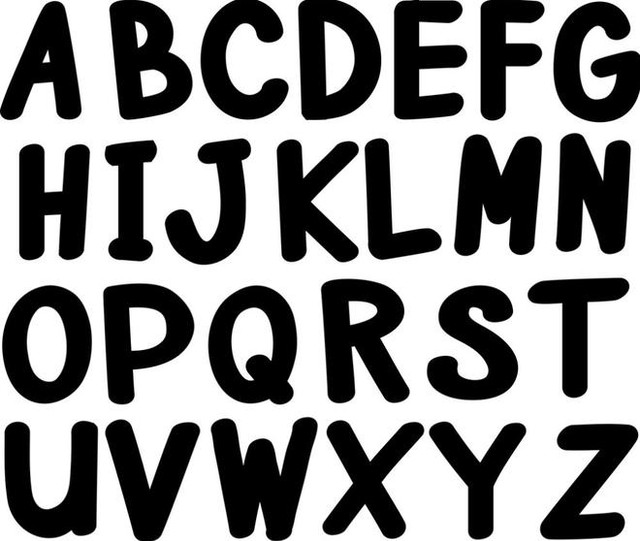


Image Properties:
Height: 541 pixels
Width: 640 pixels
Color Channels: 3 (Blue, Green, Red, and transparency (if exists))


In [11]:

# 1. Download the image
image_path = download_sample_image(imglib[6])
print("Setup complete. Sample image downloaded as 'sample_image.jpg'.")

# 2. Read the image using OpenCV
# Note: By default, OpenCV reads images in BGR format (Blue, Green, Red) (similar to using
# the flag cv2.IMREAD_COLOR).
# However, here, we use the flag -1 to force openCV to read image as it is.
# We can use the flag cv2.IMREAD_UNCHANGED for this purpose
original_image = cv2.imread(image_path, -1)  # or use the comman cv2.imread(imgpath, cv2.IMREAD_UNCHANGED)

# 3. Display the image
print("\n--- Original Image ---")
cv2_imshow(original_image)

# Check image dimensions (Height, Width, Channels)
# Must check if length of image shape is less than 3 (grayscale)
# If it is less than 3, then number of channel is 1
# Otherwise, get the number of channel from image shape itself
if len(original_image.shape) < 3:
    channels = 1
    height, width = original_image.shape
else:
    height, width, channels = original_image.shape

# Print image properties
print(f"\nImage Properties:")
print(f"Height: {height} pixels")
print(f"Width: {width} pixels")
if channels == 1:
    print(f"Color Channels: {channels} (Grayscale)")
else:
    print(f"Color Channels: {channels} (Blue, Green, Red, and transparency (if exists))")


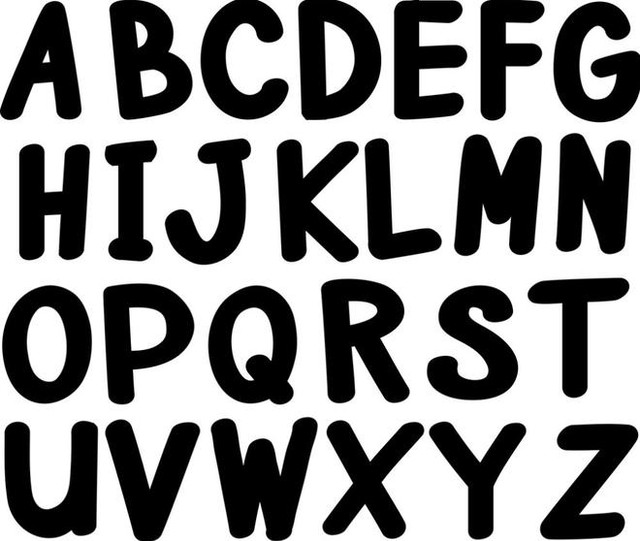

(541, 640, 3)

In [12]:
# Select particular image
# myImage = testImg[6]
myImage = original_image
cv2_imshow(myImage)
myImage.shape

## Erosion

- Involves eroding the outer surface (foreground) of the image.
- Usually, it is suggested to have the foreground as white.
- The thickness depends on the size and shape of the kernel.

In [13]:
# Convert to grayscale
myImageGray = cv2.cvtColor(myImage, cv2.COLOR_BGR2GRAY)

# binarize image
myImageBinr = cv2.threshold(myImageGray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# invert the image
myImageInv = cv2.bitwise_not(myImageBinr)

# define kernel
kernel5 = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
# alternative kernel definition
kernel5b = np.ones((5,5), np.uint8)

# perform the erosion - default iterations = 1
myImageEroded = cv2.erode(myImageInv, kernel5)
myImageEroded2 = cv2.erode(myImageInv, kernel5b, iterations = 3)

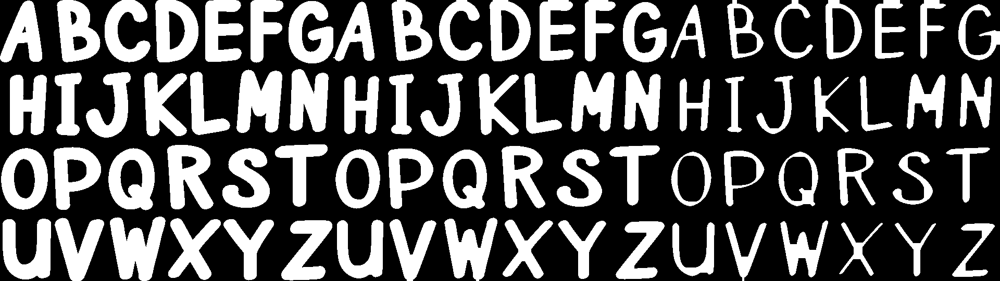

In [14]:
cv2_imshow(np.hstack((myImageInv, myImageEroded, myImageEroded2)))

## Dilation

- Dilating the outer surface (foreground) of the image
- Recommended to have foreground as white
- The thickness of the dilation depends on the size and shape of the kernel

In [15]:
# define kerneal
kernel3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))

# dilate the image
myImageDilated = cv2.dilate(myImageInv, kernel3, iterations = 2)
myImageDilated2 = cv2.dilate(myImageInv, kernel5, iterations = 1)

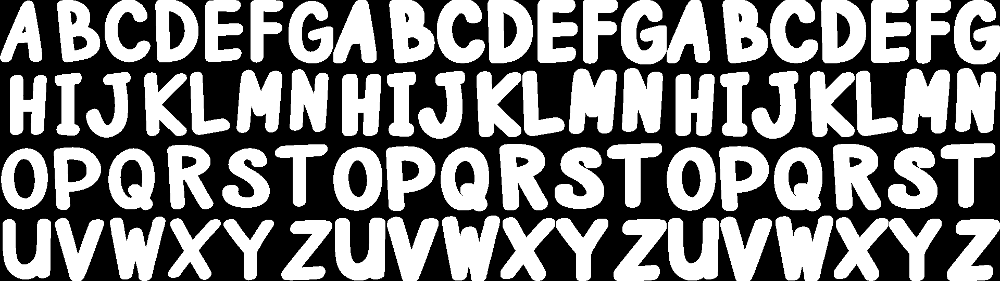

In [16]:
cv2_imshow(np.hstack((myImageInv, myImageDilated, myImageDilated2)))

## Edge using Erosion

In [17]:
myImageEdge = myImageInv - myImageEroded

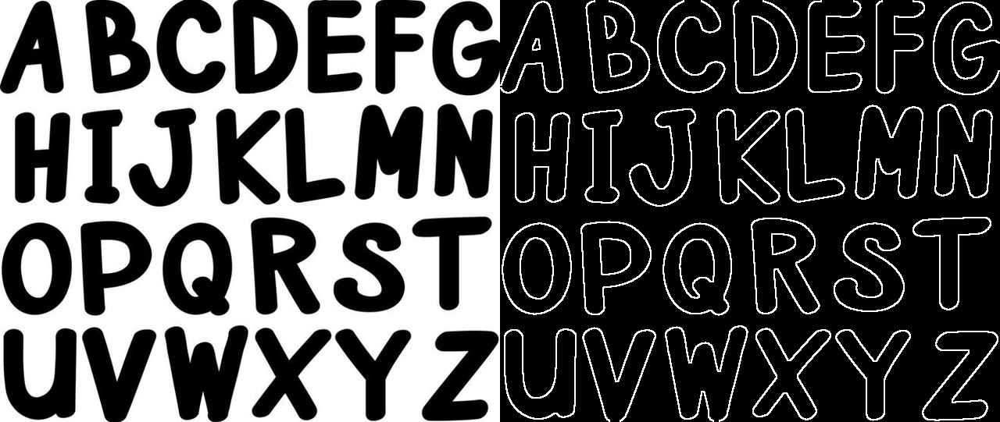

In [18]:
cv2_imshow(np.hstack((myImageGray, myImageEdge)))

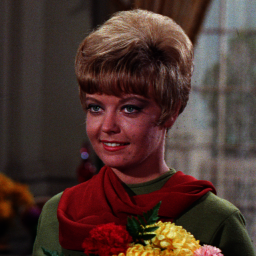

(256, 256, 4)

In [20]:
# Using different image
# myImage02 = testImg[1]
myImage02 = cv2.imread(download_sample_image(imglib[1]), -1)
cv2_imshow(myImage02)
myImage02.shape

In [21]:
# Grayscale conversion
myImage02Gray = cv2.cvtColor(myImage02, cv2.COLOR_BGR2GRAY)

# Binary conversion
ret, myImage02Binr = cv2.threshold(myImage02Gray, 50, 255, cv2.THRESH_BINARY)

# Erosion
myImage02Eroded = cv2.erode(myImage02Binr, kernel3)

# Edge computation
myImage02Edge = myImage02Binr- myImage02Eroded

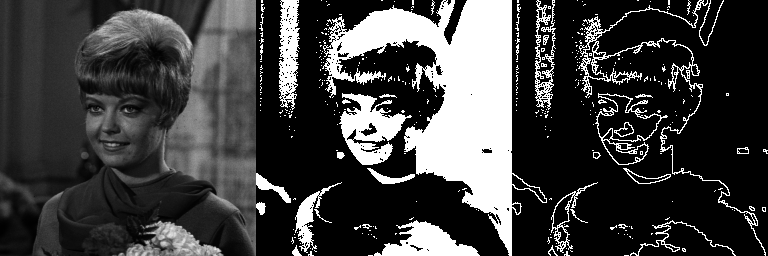

In [22]:
cv2_imshow(np.hstack((myImage02Gray, myImage02Binr, myImage02Edge)))

In [23]:
# Erosion On color image
kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT, (2,2) )
myImage02ErodeCol02 = cv2.erode(myImage02, kernel2)
myImage02ErodeCol03 = cv2.erode(myImage02, kernel3)
myImage02ErodeCol05 = cv2.erode(myImage02, kernel5)

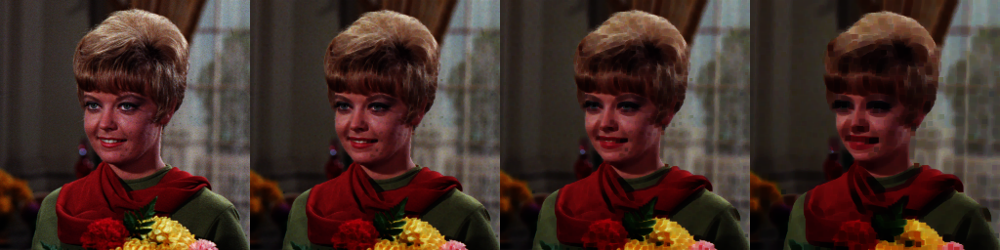

In [24]:
cv2_imshow(np.hstack((myImage02, myImage02ErodeCol02, myImage02ErodeCol03, myImage02ErodeCol05)))

In [25]:
# Dilation on color image
myImage02DilationCol02 = cv2.dilate(myImage02, kernel2)
myImage02DilationCol03 = cv2.dilate(myImage02, kernel3)
myImage02DilationCol05 = cv2.dilate(myImage02, kernel5)


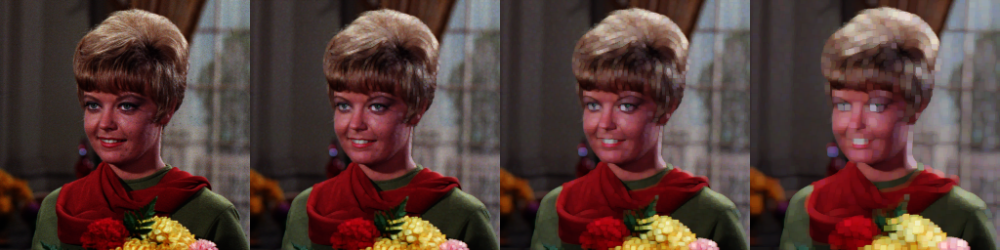

In [26]:
cv2_imshow(np.hstack((myImage02, myImage02DilationCol02, myImage02DilationCol03, myImage02DilationCol05)))

## Structuring Element

In [27]:
# Define kernels
kernelA = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
kernelB = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
kernelC = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))

# Perform erosion
myImageErodedA = cv2.dilate(myImageInv, kernelA)
myImageErodedB = cv2.dilate(myImageInv, kernelB)
myImageErodedC = cv2.dilate(myImageInv, kernelC)

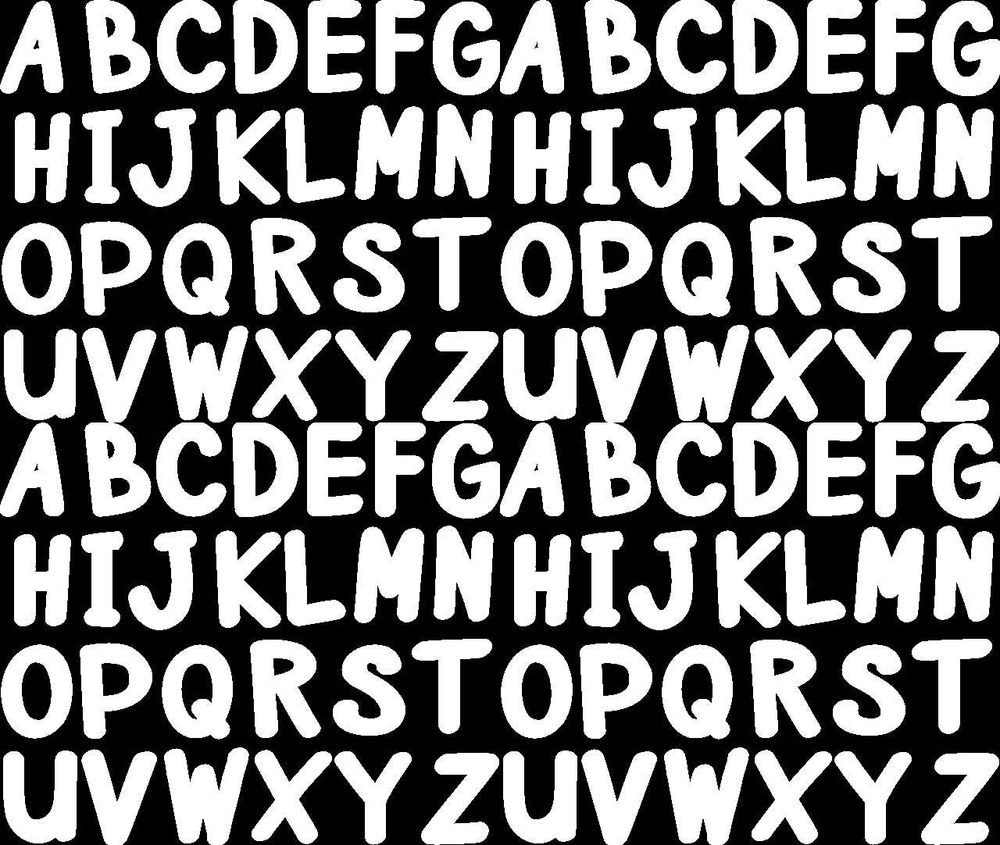

In [28]:
# See results
row1 = np.hstack((myImageInv,myImageErodedA))
row2 = np.hstack((myImageErodedB,myImageErodedC))

cv2_imshow(np.vstack((row1,row2)))

## Opening

- Involves erosion followed by dilation in the outer surface
- It is generally used to remove noise on the image

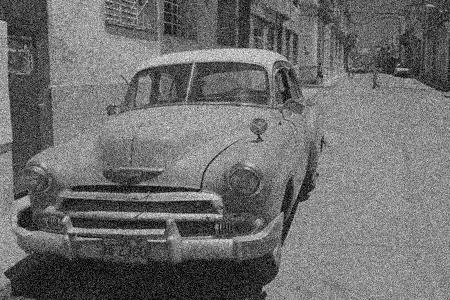

(300, 450)

In [29]:
# Upload noisy image
# myImage03 = testImg[7]
myImage03 = cv2.imread(download_sample_image(imglib[7]), -1)
cv2_imshow(myImage03)
myImage03.shape

In [30]:
# binarize the image
myImage03Binr = cv2.threshold(myImage03, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

# Inversion
myImage03Inv = cv2.bitwise_not(myImage03Binr)

# opening
myImage03Opening = cv2.morphologyEx(myImage03Inv, cv2.MORPH_OPEN, kernel3)


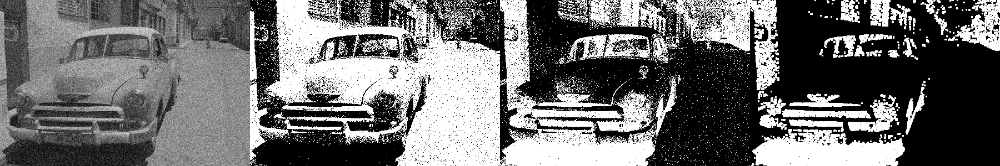

In [31]:
cv2_imshow(np.hstack((myImage03, myImage03Binr, myImage03Inv, myImage03Opening)))

## Closing

- Involves dilation followed by erosion in the outer surface
- It can also be used to remove noise on the image

In [32]:
# Closing
myImage03Closing = cv2.morphologyEx(myImage03Binr, cv2.MORPH_CLOSE, kernelB)

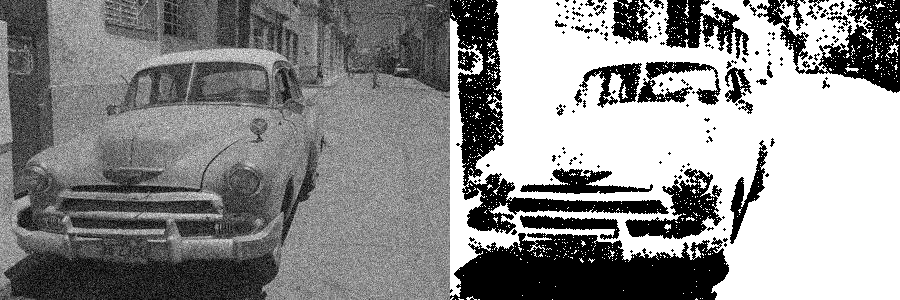

In [33]:
cv2_imshow(np.hstack((myImage03, myImage03Closing)))

## Morphological Gradient

- Morphological gradient applies erosion first, followed by dilation individually on the image
- Subsequently, it computes the difference between the eroded and dilated images
- The output will be an outline of the image

In [34]:
kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT, (2,2) )

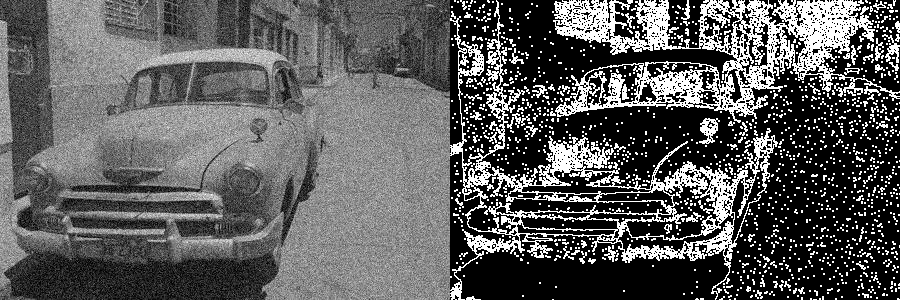

In [35]:
# Use noisy image (already in binary image), but then converted
myImage03Inv = cv2.bitwise_not(myImage03Binr)
# Morphological gradient computation
myImage03MorphGrad = cv2.morphologyEx(myImage03Inv, cv2.MORPH_GRADIENT, kernel2)
# Show the results
cv2_imshow(np.hstack((myImage03, myImage03MorphGrad)))

In [36]:
# Use different image
myImage01MorphGrad = cv2.morphologyEx(myImageInv, cv2.MORPH_GRADIENT, kernel5)

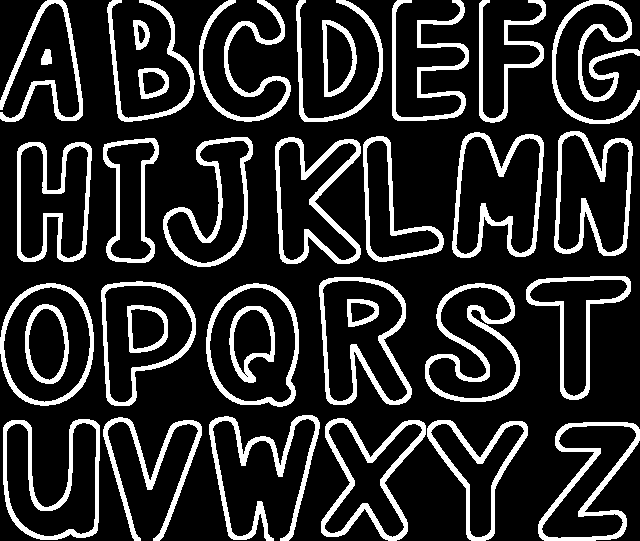

In [37]:
cv2_imshow(myImage01MorphGrad)

In [38]:
# Using image 02
myImage02Inv = cv2.bitwise_not(myImage02Binr)

# Use morphological gradient
myImage02MorphGrad = cv2.morphologyEx(myImage02Binr, cv2.MORPH_GRADIENT, kernel2)

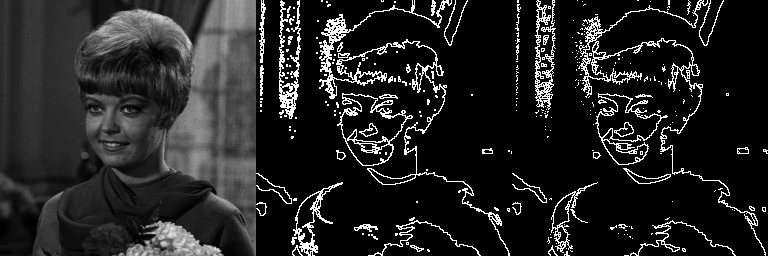

In [39]:
cv2_imshow(np.hstack((myImage02Gray, myImage02MorphGrad, myImage02Edge)))

## Top Hat Transformation

 - Perform opening on the binary image.
 - Followed by calculating the difference between the input image and the opened one.
 - Can be used to reveal **bright regions** of an image on **dark backgrounds**
 - Can be applied to binary as well as grayscale image (some said that it is more suitable for grayscale image rather than binary ones.


In [40]:
# Use noisy binary image
myImage03TopHat2 = cv2.morphologyEx(myImage03Binr, cv2.MORPH_TOPHAT, kernel2)
myImage03TopHat3 = cv2.morphologyEx(myImage03Binr, cv2.MORPH_TOPHAT, kernel3)
myImage03TopHat5 = cv2.morphologyEx(myImage03Binr, cv2.MORPH_TOPHAT, kernel5)

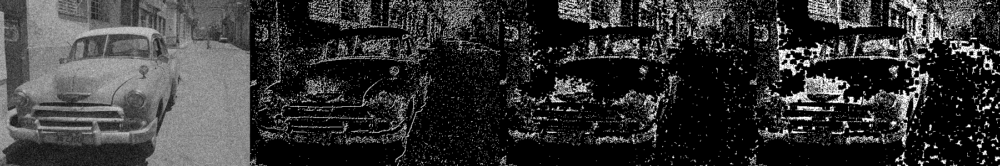

In [41]:
cv2_imshow(np.hstack((myImage03, myImage03TopHat2, myImage03TopHat3, myImage03TopHat5)))

In [42]:
# Use noisy grayscale image
myImage03TopHat2 = cv2.morphologyEx(myImage03, cv2.MORPH_TOPHAT, kernel2)
myImage03TopHat3 = cv2.morphologyEx(myImage03, cv2.MORPH_TOPHAT, kernel3)
myImage03TopHat5 = cv2.morphologyEx(myImage03, cv2.MORPH_TOPHAT, kernel5)

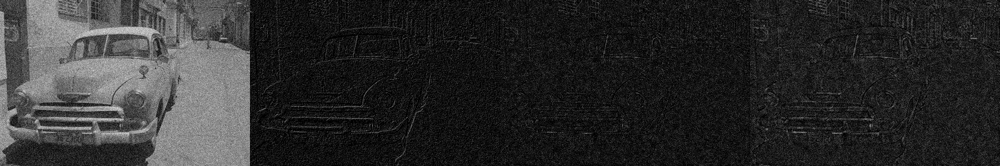

In [43]:
cv2_imshow(np.hstack((myImage03, myImage03TopHat2, myImage03TopHat3, myImage03TopHat5)))

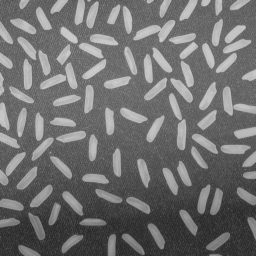

(256, 256)

In [44]:
# Rice image
# myImage04 = testImg[8]
myImage04 = cv2.imread(download_sample_image(imglib[8]), -1)
cv2_imshow(myImage04)
myImage04.shape

In [45]:
# Binarize the image
myImage04Binr = cv2.threshold(myImage04, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# define kernel
kernel9 = cv2.getStructuringElement(cv2.MORPH_RECT, (9,9))

# Top hat
myImage04TopHat = cv2.morphologyEx(myImage04Binr, cv2.MORPH_TOPHAT, kernel9)

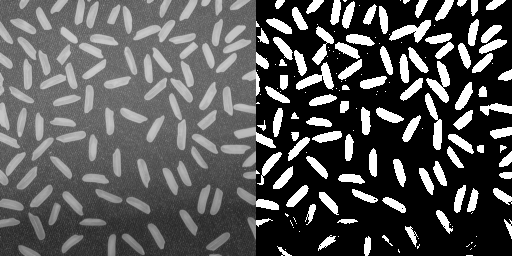

In [46]:
cv2_imshow(np.hstack((myImage04, myImage04TopHat)))

In [47]:
# Top Hat Transformation for grayscale rice image
myImage04TopHat2 = cv2.morphologyEx(myImage04, cv2.MORPH_TOPHAT, kernel2)
myImage04TopHat3 = cv2.morphologyEx(myImage04, cv2.MORPH_TOPHAT, kernel3)
myImage04TopHat5 = cv2.morphologyEx(myImage04, cv2.MORPH_TOPHAT, kernel5)
myImage04TopHat9 = cv2.morphologyEx(myImage04, cv2.MORPH_TOPHAT, kernel9)


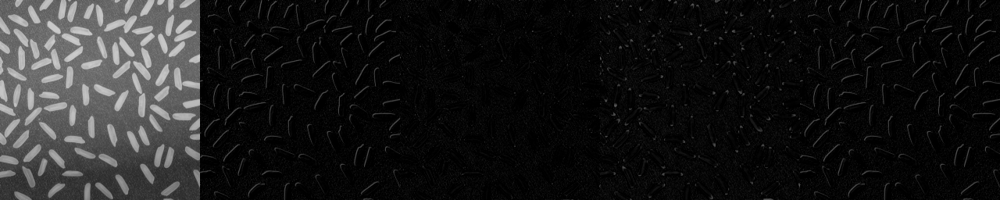

In [48]:
cv2_imshow(np.hstack((myImage04, myImage04TopHat2, myImage04TopHat3, myImage04TopHat5, myImage04TopHat2, )))

## Black Hat

 - Perform closing on the binary image.
 - Followed by calculating the difference between the input image and the closed one.
 - Can be used to reveal **dark regions** of an image on **light/bright backgrounds**


In [52]:
# Use noisy image
myImage03BlackHat = cv2.morphologyEx(myImage03Binr, cv2.MORPH_BLACKHAT, kernel5)

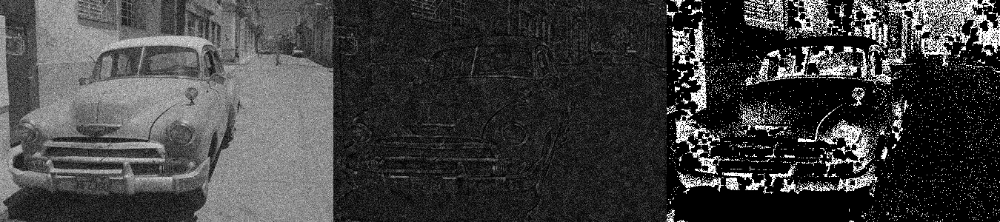

In [53]:
cv2_imshow(np.hstack((myImage03, myImage03TopHat5, myImage03BlackHat)))

In [54]:
# Use rice image
myImage04BlackHat = cv2.morphologyEx(myImage04Binr, cv2.MORPH_BLACKHAT, kernel9)

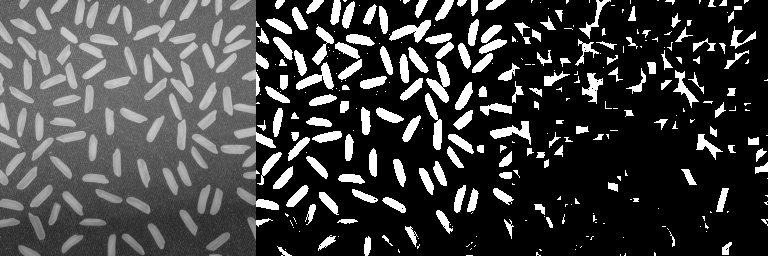

In [55]:
cv2_imshow(np.hstack((myImage04, myImage04TopHat, myImage04BlackHat)))

## Combined top hat and black hat operations

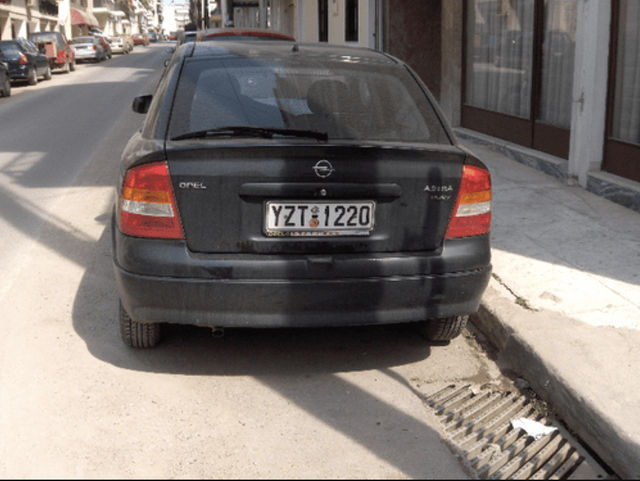

(541, 640, 3)

In [56]:
# myImage05 = testImg[9]
myImage05 = cv2.imread(download_sample_image(imglib[9]), -1)
cv2_imshow(myImage05)
myImage.shape

In [57]:
# Convert to grayscale
myImage05Gray = cv2.cvtColor(myImage05, cv2.COLOR_BGR2GRAY)

# kernel for car plate
plateKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))

# Blackhat
myImage05BlackHat = cv2.morphologyEx(myImage05Gray, cv2.MORPH_BLACKHAT, plateKernel)

# Tophat
myImage05TopHat = cv2.morphologyEx(myImage05Gray, cv2.MORPH_TOPHAT, plateKernel)


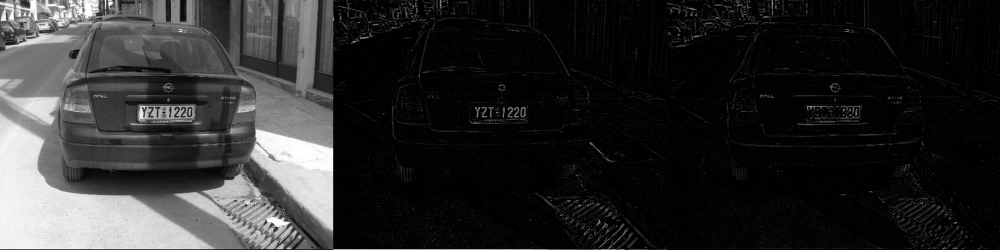

In [58]:
cv2_imshow(np.hstack((myImage05Gray,myImage05BlackHat,myImage05TopHat)))

In [59]:
# Combined
myImage05CombHat = cv2.morphologyEx(myImage05TopHat, cv2.MORPH_BLACKHAT, plateKernel)

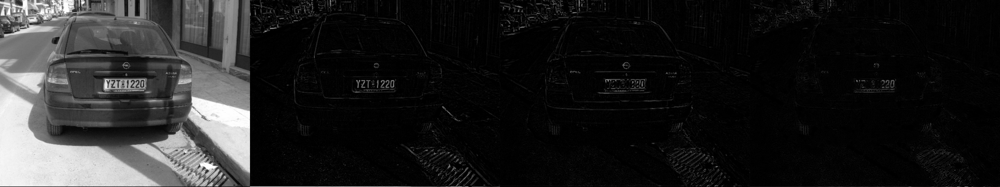

In [60]:
cv2_imshow(np.hstack((myImage05Gray,myImage05BlackHat,myImage05TopHat,myImage05CombHat)))

In [62]:
# Combined 2
myImage05CombHat2 = cv2.morphologyEx(myImage05BlackHat, cv2.MORPH_TOPHAT, plateKernel)

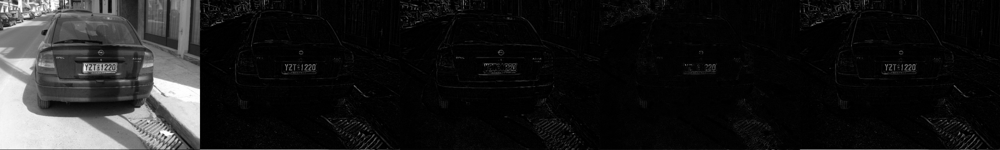

In [63]:
cv2_imshow(np.hstack((myImage05Gray,myImage05BlackHat,myImage05TopHat,myImage05CombHat,myImage05CombHat2)))

# ASSIGNMENT W11/W12


## Instructions

- Use the camera on your cellphone to take a photo of the car/motorcycle license plate in the parking lot
  - Various background: black/white
  - Various lighting: morning / night
- Apply tophat/blackhat transformation to identify the car license plate and its numbers
- Still using the help of morphological processing, remove parts of the image that are not part of the license plate
- Use contour detection to encapsulate license plate number (rect. box vs rotated box vs enclosing circle)